In [4]:
import sys
from IPython.display import display, Javascript

def restart_kernel():
    """Restart the Jupyter Notebook kernel to reflect changes in modules and packages."""
    display(Javascript("Jupyter.notebook.kernel.restart()"))
    print("Kernel is restarting...")

restart_kernel()

import bptf
from bptf import BPTF
import numpy as np
import pandas as pd
import sparse
import os
import shutil
from tqdm import tqdm
import pickle
import scipy.stats as st
import matplotlib.pyplot as plt
import torch
import tensorly
import cupy

import multiprocessing
from joblib import Parallel, delayed
from tqdm.contrib.concurrent import process_map

import gc
gc.collect()

<IPython.core.display.Javascript object>

Kernel is restarting...


0

In [5]:
os.getcwd()
# tensorly.set_backend('pytorch')

'/home/luiyusen/projects/bptf_new'

In [6]:
def dataframe_to_sparse_tensor(data, country_indices, date_indices, database_indices, cameo_col='CAMEO_Code', events_col='Num_Events'):
    """
    Converts a pandas DataFrame into an sptensor.
    
    Parameters:
        data (pd.DataFrame): The DataFrame containing the data.
        country_indices (pd.DataFrame): DataFrame with country indices.
        date_indices (pd.DataFrame): DataFrame with date indices.
        database_indices (pd.DataFrame): DataFrame with database indices.
        cameo_col (str): Name of the CAMEO code column in 'data'. Defaults to 'CAMEO_Code'.
        events_col (str): Name of the column containing event counts in 'data'. Defaults to 'Num_Events'.
    
    Returns:
        sptensor: The resulting sparse tensor.
    """
    
    # Define the shape of the tensor (V, V, A, T, D)
    V = len(country_indices)
    A = 20  # Assuming the CAMEO code has 20 distinct values
    T = len(date_indices)
    D = len(database_indices)
    
    shape = (V, V, A, T, D)
    
    # Initialize empty subs and vals
    subs = ([], [], [], [], [])
    vals = []

    # Iterate through the DataFrame to populate the tensor
    for i in range(len(data)):

        source_country = country_indices.loc[country_indices['country'] == data['Source_Country_Code'].iloc[i]]
        source_country_index = int(source_country.iloc[0, 1])

        target_country = country_indices.loc[country_indices['country'] == data['Target_Country_Code'].iloc[i]]
        target_country_index = int(target_country.iloc[0, 1])

        action_index = int(data[cameo_col].iloc[i] - 1)  # Adjust CAMEO code to 0-based index

        date = date_indices.loc[date_indices['date'] == data['formatteddate'].iloc[i]]
        date_index = int(date.iloc[0, 1])

        database = database_indices.loc[database_indices['database'] == data['Database'].iloc[i]]
        database_index = int(database.iloc[0, 1])

        # Append indices and values
        subs[0].append(source_country_index)
        subs[1].append(target_country_index)
        subs[2].append(action_index)
        subs[3].append(date_index)
        subs[4].append(database_index)
        vals = np.append(vals, data[events_col].iloc[i])

    # Convert subs to a tuple of numpy arrays and vals to a numpy array
    subs = tuple(np.array(s, dtype=int) for s in subs)
    vals = np.array(vals)

    # Create the sparse COO tensor
    Y = sparse.COO(coords=subs, data=vals, shape=shape)
    
    return Y

def add_sparse_tensors(tensor1, tensor2):
    assert tensor1.shape == tensor2.shape, "Tensors must have the same shape to be added."
    
    # Directly add the two tensors
    result_tensor = tensor1 + tensor2
    
    return result_tensor


def sum_sparse_tensor_list(tensor_list):
    if not tensor_list:
        raise ValueError("The list of tensors is empty.")
    
    # Use sum with a starting tensor of 0 in the shape of the tensors
    result_tensor = sum(tensor_list[1:], start=tensor_list[0])
    
    return result_tensor

# Get data

In [7]:
# read files by batch
folder = "/dyadic_data_2000_2020_inclusive/"
data_filepath = os.getcwd() + folder
files = os.listdir(data_filepath)
for filepath in tqdm(files, desc = 'Reading data'):
    complete_filepath = data_filepath + filepath
    file = pd.read_csv(complete_filepath)
    if filepath == files[0]:
        data = file
    else:
        data = pd.concat([data, file])
    del file
data = data.sort_values(by='Num_Events', ascending=False)

Reading data: 100%|██████████| 85/85 [05:34<00:00,  3.94s/it]


In [8]:
# get GDELT data from GDELT database to replace gdelt in original data
gdelt_filepaths = [os.path.join('GDELT', f) for f in os.listdir('GDELT')]
# gdelt = [pd.read_csv(gdelt_filepath, dtype={'EventBaseCode': str}) for gdelt_filepath in gdelt_filepaths]

def read_gdelt(filepath):
    gdelt = pd.read_csv(filepath, dtype={'EventBaseCode': str})
    colnames = data.columns
    gdelt = gdelt.rename(columns={'Actor1CountryCode' : colnames[0],
                                'Actor2CountryCode' : colnames[1],
                                'EventBaseCode' : colnames[2],
                                'SQLDATE' : colnames[3],
                                'NumMentions' : colnames[4]})
    gdelt = gdelt[gdelt['CAMEO_Code'].str.isnumeric()]
    gdelt['CAMEO_Code'] = gdelt['CAMEO_Code'].astype(int)
    gdelt['formatteddate'] = pd.to_datetime(gdelt['formatteddate'], format='%Y%m%d')
    gdelt['formatteddate'] = gdelt['formatteddate'].dt.strftime('%Y-%m-%d')
    return gdelt

if __name__ == '__main__':
    gdelt = Parallel(n_jobs = multiprocessing.cpu_count())(
        delayed(read_gdelt)(gdelt_filepath)
        for gdelt_filepath in tqdm(gdelt_filepaths, desc='Reading GDELT data')
        )
gdelt = pd.concat(gdelt)
gdelt.head()

Reading GDELT data: 100%|██████████| 21/21 [00:00<00:00, 179.43it/s]


,Source_Country_Code,Target_Country_Code,CAMEO_Code,formatteddate,Num_Events
0,AFG,AFG,4,2002-01-01,2
1,AFG,AFG,19,2002-01-01,4
2,AFG,AFG,1,2002-01-01,2
3,AFG,AFG,5,2002-01-01,3
4,AFG,AFG,5,2002-01-01,1


In [9]:
# combine the data
# we stack the data since the downloaded GDELT data is from before 2015 and the bigquery one is post-2015
# data = data[data['Database'] != 'GDELT']
gdelt['Database'] = 'GDELT'
data = pd.concat([data, gdelt])
print(data.head())
print(data.tail())
del gdelt
gc.collect()

       Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
184223                 IND                 IND           7    2009-10-05   
386863                 UKR                 RUS           1    2010-03-05   
332421                 RUS                 RUS           1    2010-01-22   
330674                 RUS                 RUS           1    2010-03-09   
332530                 RUS                 RUS           1    2009-12-29   

        Num_Events Database  
184223       11323  TERRIER  
386863        1543  TERRIER  
332421        1522  TERRIER  
330674        1290  TERRIER  
332530        1137  TERRIER  
       Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
341761                 ZWE                 GNQ           5    2008-01-31   
341762                 ZWE                 GNQ          17    2008-01-31   
341763                 ZWE                 GNQ          17    2008-01-31   
341764                 ZWE                 AFR          17 

26

In [10]:
# filter by date to get a smaller dataset to play around with
# The common years across all 3 datasets is 2000 - 2018
years = [str(2000 + x) for x in range(0, 19)]
data = data[data['formatteddate'].str.startswith(tuple(years))]

# collapse by month
data['formatteddate'] = data['formatteddate'].str[:7]
data = data.groupby(['Source_Country_Code', 'Target_Country_Code', 'CAMEO_Code', 'formatteddate', 'Database'])
data = data.sum().reset_index()

# Make the list of countries, actions, times and databases

In [11]:
# get unique list of countries
countries = pd.concat([data['Source_Country_Code'], data['Target_Country_Code']])
countries = pd.unique(countries)
country_indices = pd.DataFrame({
    'country' : countries,
    'index' : range(len(countries))
})
del countries

# there's no need to get a list of actions since it's just 1 to 20

# get unique list of dates
# Make sure to change the date format and frequency of the date range if you change the time unit
date_indices = pd.date_range(
    start=pd.to_datetime(data['formatteddate'], format='%Y-%m').min().strftime('%Y-%m'), 
    end=pd.to_datetime(data['formatteddate'], format='%Y-%m').max().strftime('%Y-%m'),
    freq='MS')
date_indices = date_indices.strftime('%Y-%m').to_list()
date_indices = pd.DataFrame({
    'date' : date_indices,
    'index' : range(len(date_indices))
})
date_indices['date'] = date_indices['date'].str[:7]

# get unique list of databases
databases = pd.unique(data['Database'])
databases = pd.unique(databases)
database_indices = pd.DataFrame({
    'database' : databases,
    'index' : range(len(databases))
})
del databases

# Convert dataframes to sparse tensors

In [12]:
if os.path.exists('sptensor.pkl'):
    with open('sptensor.pkl', 'rb') as f:
        Y = pickle.load(f)
else:
    n_batches = 10000
    n = 10

    data = np.array_split(data, n_batches)

    num_cores = multiprocessing.cpu_count()

    if __name__ == '__main__':
        data = Parallel(n_jobs = num_cores / 2)(
            delayed(dataframe_to_sparse_tensor)(batch, country_indices, date_indices, database_indices)
            for batch in tqdm(data, desc='Converting to sparse tensors')
        )

    while len(data) > 10:
        data = [data[i:i + n] for i in range(0, len(data), n)]
        data = [sum(batch) for batch in data]
    Y = sum(data)
    del data

    # Save the sptensor object to a file
    with open('sptensor.pkl', 'wb') as f:
        pickle.dump(Y, f)

In [13]:
# # split data into batches for caching and processing
# batch_size = 1000
# num_batches = int(np.ceil(len(data) / batch_size))
# for i in tqdm(range(num_batches), desc = 'Caching data'):
#     # Get the current batch of 1000 rows
#     batch_df = data.iloc[i * batch_size:(i + 1) * batch_size]
    
#     # Save the current batch to a pickle file
#     batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{i+1}.pkl")
#     with open(batch_file, 'wb') as f:
#         pickle.dump(batch_df, f)

# # check if data was cached properly
# batch_list = []
# for i in tqdm(range(num_batches), desc = 'Checking data cached correctly'):
#     batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{i+1}.pkl")
#     with open(batch_file, 'rb') as f:
#         batch_df = pickle.load(f)
    
#     # Process each batch here
#     batch_list.append(batch_df)

# assert data.equals(pd.concat(batch_list, ignore_index=True))
# del data; del batch_list

In [14]:
# if os.path.exists('sptensor.pkl'):
#     with open('sptensor.pkl', 'rb') as f:
#         Y = pickle.load(f)
# else:

#     for batch_number in tqdm(range(num_batches), desc='Converting'):
#         batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{batch_number+1}.pkl")
#         with open(batch_file, 'rb') as f:
#             batch_df = pickle.load(f)

#         Y_batch = dataframe_to_sparse_tensor(
#             batch_df, country_indices, date_indices, database_indices, 'CAMEO_Code', 'Num_Events')
#         Y_batch_file = os.path.join(os.getcwd() + '\\cache\\sptensor_cache\\', f"batch_{batch_number+1}.pkl")
#         with open(Y_batch_file, 'wb') as f:
#             pickle.dump(Y_batch, f)

#     for i in tqdm(range(num_batches), desc='Combining'):
#         Y_batch_file = os.path.join(os.getcwd() + '\\cache\\sptensor_cache\\', f"batch_{i+1}.pkl")
#         with open(Y_batch_file, 'rb') as f:
#             Y_batch = pickle.load(f)
        
#         if i == 0:
#             Y = Y_batch
#         else:
#             Y = add_sparse_tensors(Y, Y_batch)

# # Save the sptensor object to a file
# with open('sptensor.pkl', 'wb') as f:
#     pickle.dump(Y, f)

# # Load the sptensor object from the file
# with open('sptensor.pkl', 'rb') as f:
#     Y = pickle.load(f)

# Tensor factorisation

In [15]:
# Y = torch.sparse_coo_tensor(
#     torch.tensor(Y.coords, dtype=torch.long),  # Indices
#     torch.tensor(Y.data),                      # Values
#     size=Y.shape,                              # Explicit keyword argument for size
#     device='cuda'                              # Send directly to GPU
# )

In [16]:
# decompose the tensor using Poisson CP decomposition
gc.collect()
n_components = 100

if os.path.exists('bptf_5mode_50iter.pkl'):
    with open('bptf_5mode_50iter.pkl', 'rb') as f:
        bptf_5mode = pickle.load(f)
else:
    bptf_5mode = BPTF(data_shape=Y.shape, n_components=n_components)
    bptf_5mode.fit(Y, max_iter = 50, verbose=True)
    
    with open('bptf_5mode_50iter.pkl', 'wb') as f:
        pickle.dump(bptf_5mode, f)

# Checks

In [17]:
# check the shapes
for j in range(len(Y.shape)):
    assert bptf_5mode.G_DK_M[j].shape == (Y.shape[j], n_components)

# Reconstruction

In [18]:
Y_hat = bptf_5mode.reconstruct()
Y_original = Y.todense()

# print(Y_hat[:5, :5, 0, 0, 0]); print(Y[:5, :5, 0, 0, 0].todense())
print(Y[:5, :5, 0, 0, 0].todense() - Y_hat[:5, :5, 0, 0, 0])

[[-1.64334517e-04 -4.73437944e-05 -1.23203864e-04 -1.33597374e-03
  -5.20645182e-05]
 [-1.61117447e-05  1.54776867e+01 -6.99917782e-03 -6.22923657e-03
  -5.47953138e-06]
 [-6.92580130e-05 -4.01110049e-03 -6.14672118e-01 -4.31863136e-01
  -1.98356535e-05]
 [-5.32505153e-04 -4.94455501e-03 -4.51056094e-01  1.64875725e+01
  -4.60288887e-05]
 [-4.29273749e-05 -1.66556479e-05 -3.19420265e-05 -3.70567392e-05
   9.99982317e-01]]


# Compare with Tensorly's CP decomposition

### 2-norm error

In [ ]:
if os.path.exists('nntf_parafac_5mode.pkl'):
    with open('nntf_parafac_5mode.pkl', 'rb') as f:
        tensor_mu = pickle.load(f)
else:
    cp_init = tensorly.cp_tensor.CPTensor(
        tensorly.decomposition._cp.initialize_cp(
            Y, non_negative = True, init = 'random', rank = n_components
            )
        )
    tensor_mu, _ = tensorly.decomposition.non_negative_parafac(
        Y, rank=n_components, init=cp_init, return_errors=True
        )
    
    with open('nntf_parafac_5mode.pkl', 'wb') as f:
        pickle.dump(tensor_mu, f)

In [ ]:
print(torch.norm(torch.from_numpy(Y.todense()) - torch.from_numpy(tensorly.cp_to_tensor(tensor_mu)), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
# it's pretty close to tensorly's implementation when using frobenius norm forward error

tensor(0.2377, dtype=torch.float64)


C:\Users\luiyu\AppData\Local\Temp\ipykernel_28712\3844550198.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') /


tensor(0.9682, dtype=torch.float64)


### Comparing non-zero element prediction accuracy

In [ ]:
nonzero_indices = np.vstack(sparse.nonzero(Y)).T.tolist()
nonzero_indices = [tuple(ele) for ele in nonzero_indices]

largest_indices = np.argpartition(Y_hat.ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, Y_hat.shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_BPTF = len(set(nonzero_indices) & set(largest_indices))

largest_indices = np.argpartition(tensorly.cp_to_tensor(tensor_mu).ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, tensorly.cp_to_tensor(tensor_mu).shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_NNCP = len(set(nonzero_indices) & set(largest_indices))

In [ ]:
print(f'Proportion of nonzero elements correctly predicted by BPTF: {num_correct_predictions_BPTF / Y.nnz}')
print(f'Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: {num_correct_predictions_NNCP / Y.nnz}')

Proportion of nonzero elements correctly predicted by BPTF: 0.6372704658237569
Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: 0.6004870907261741


# Plot components

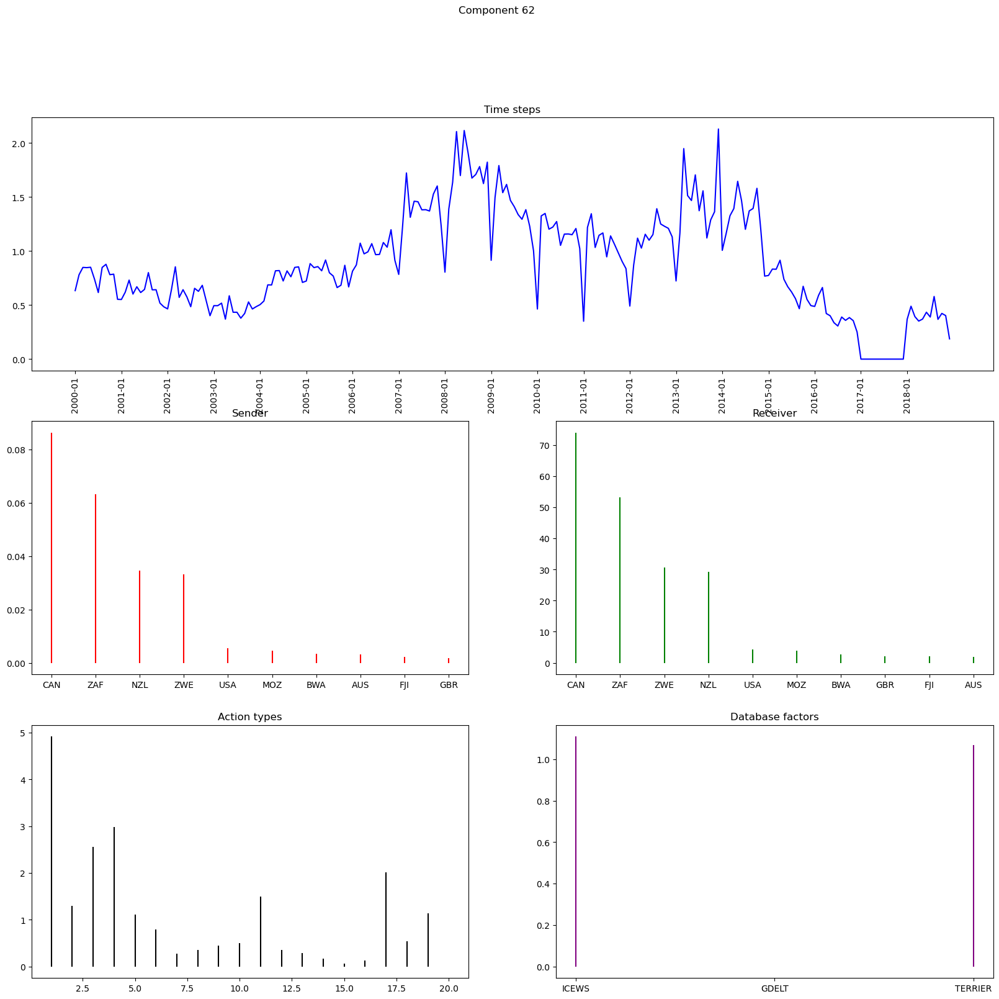

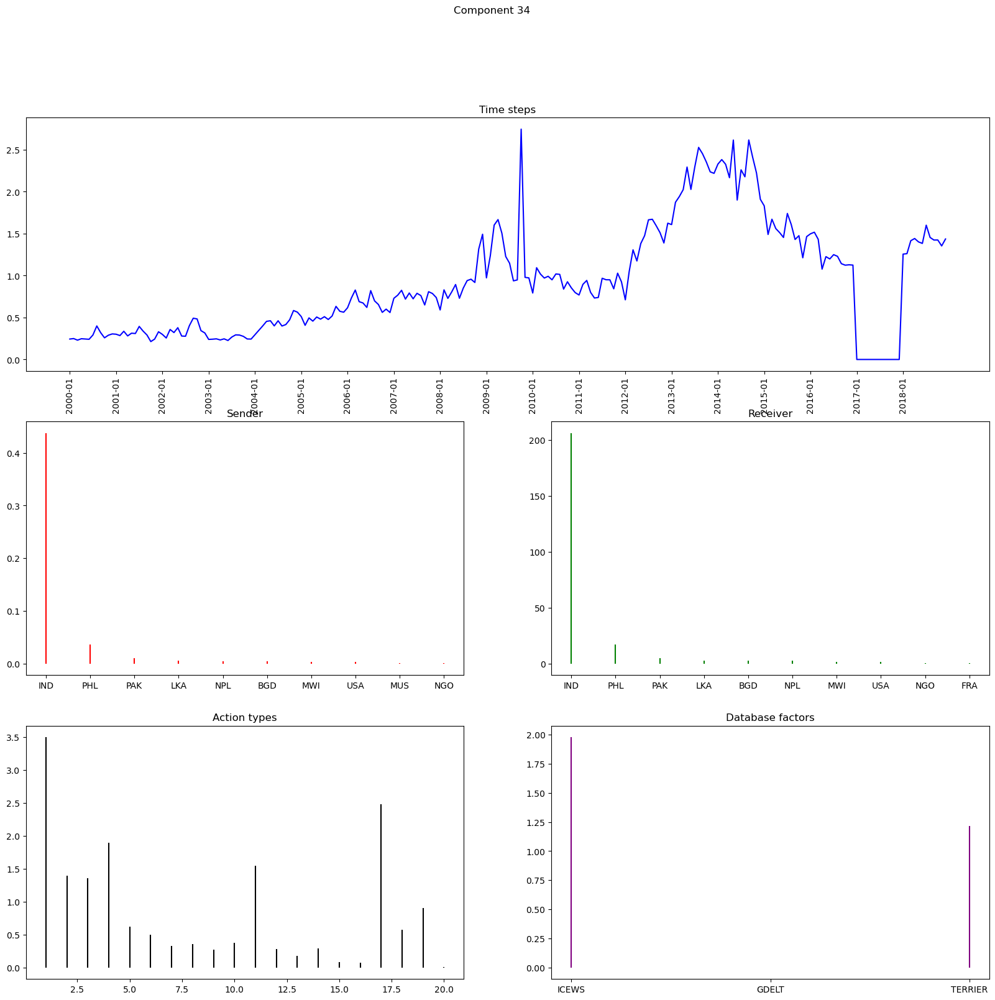

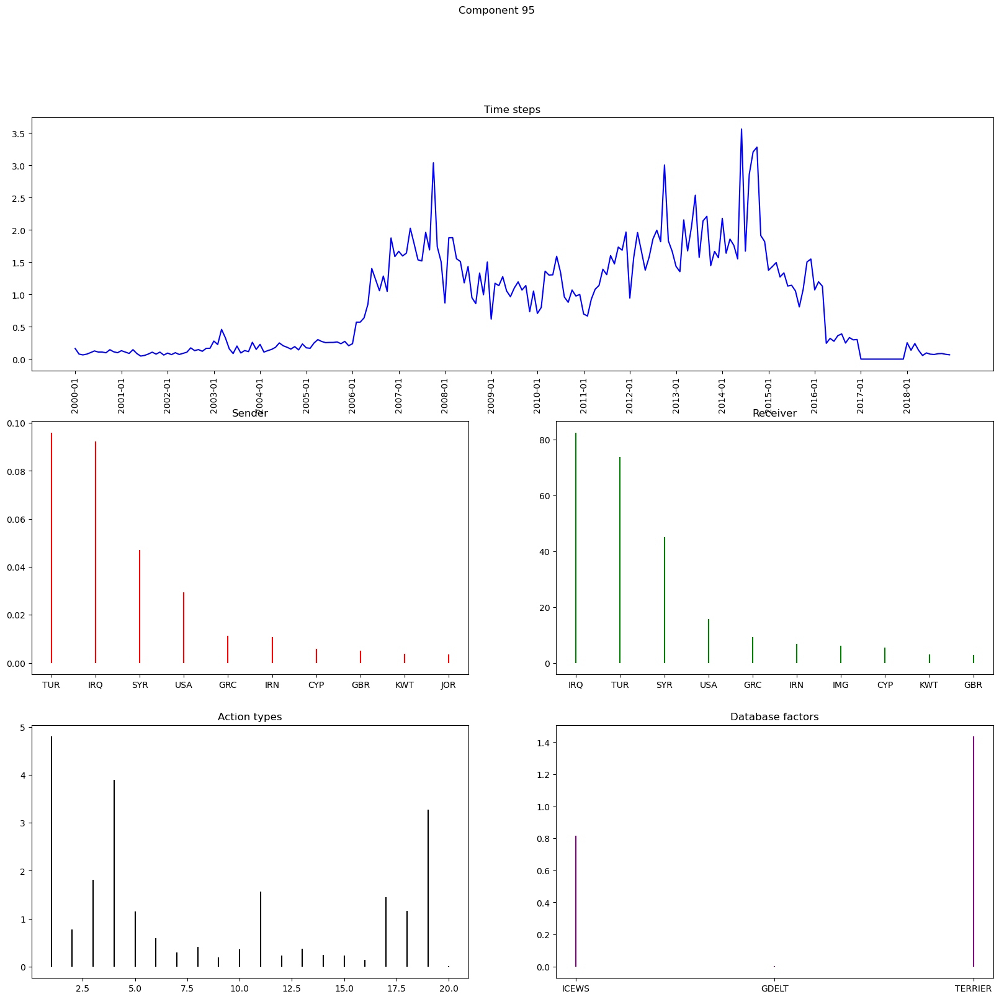

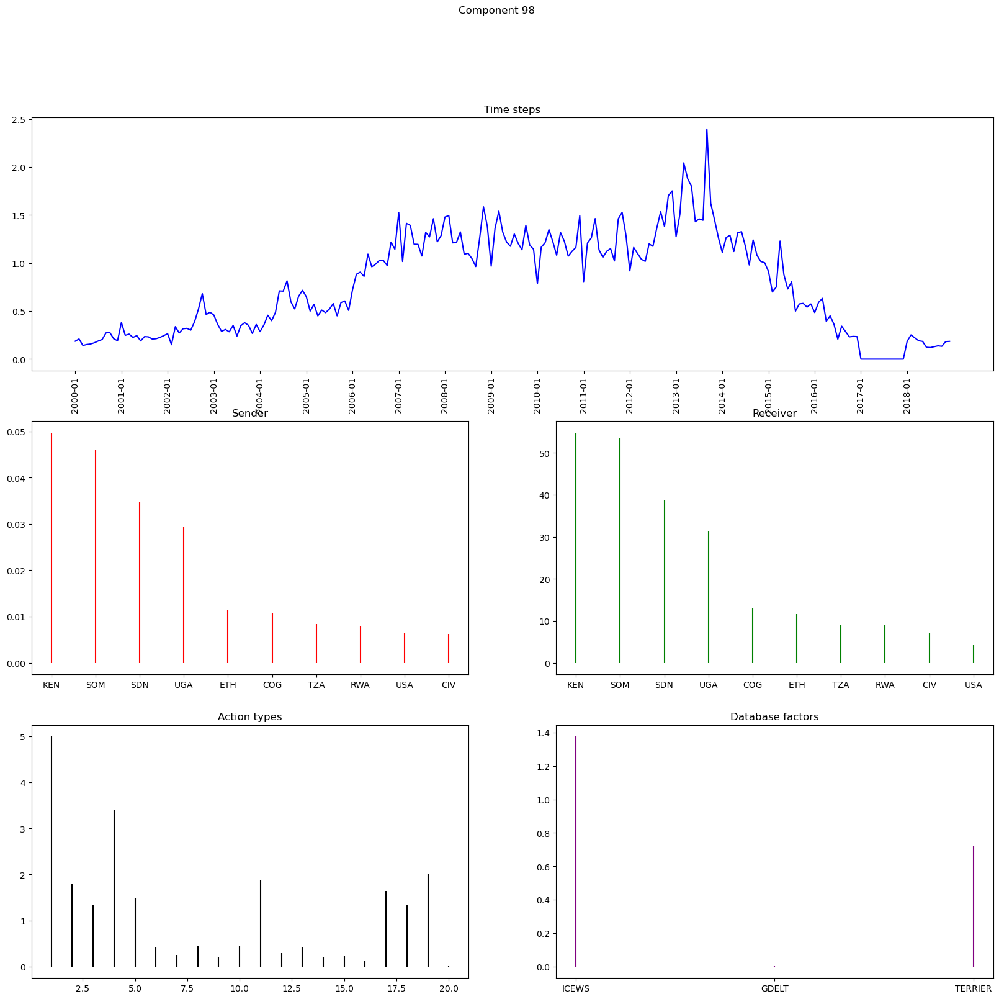

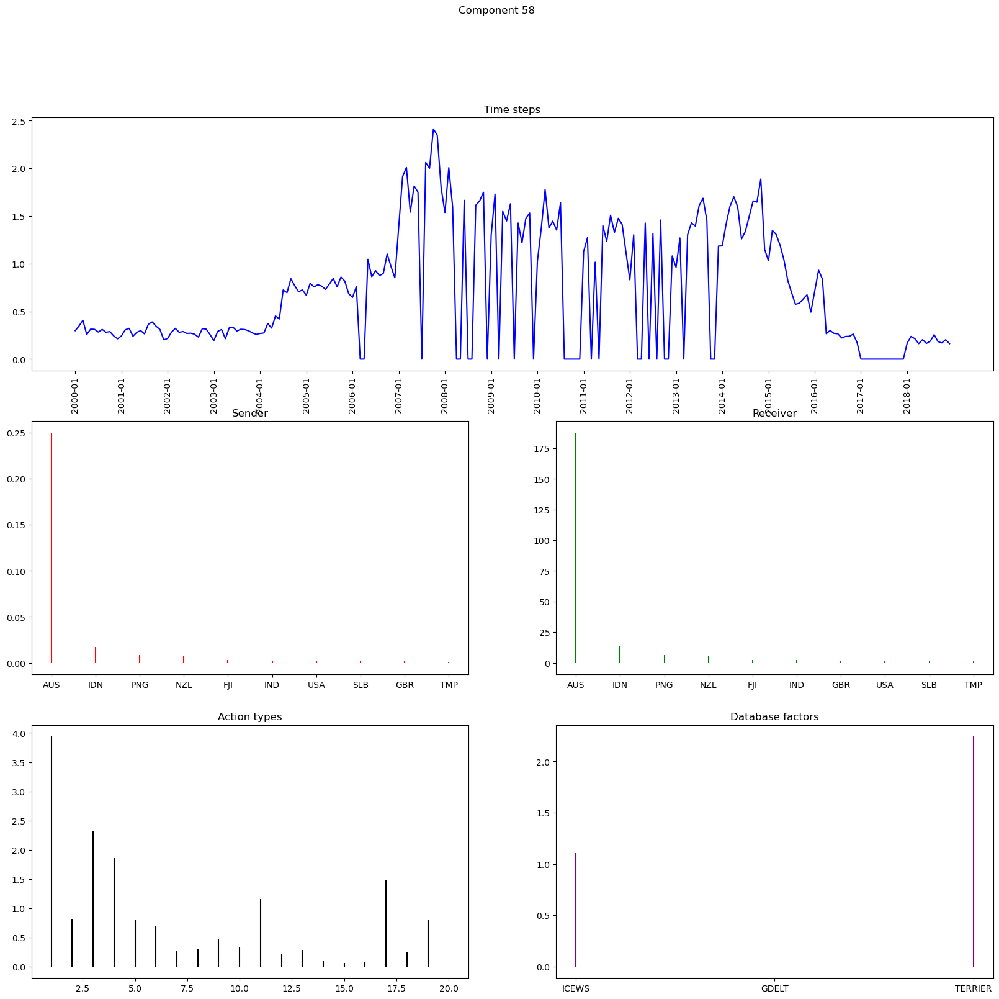

...

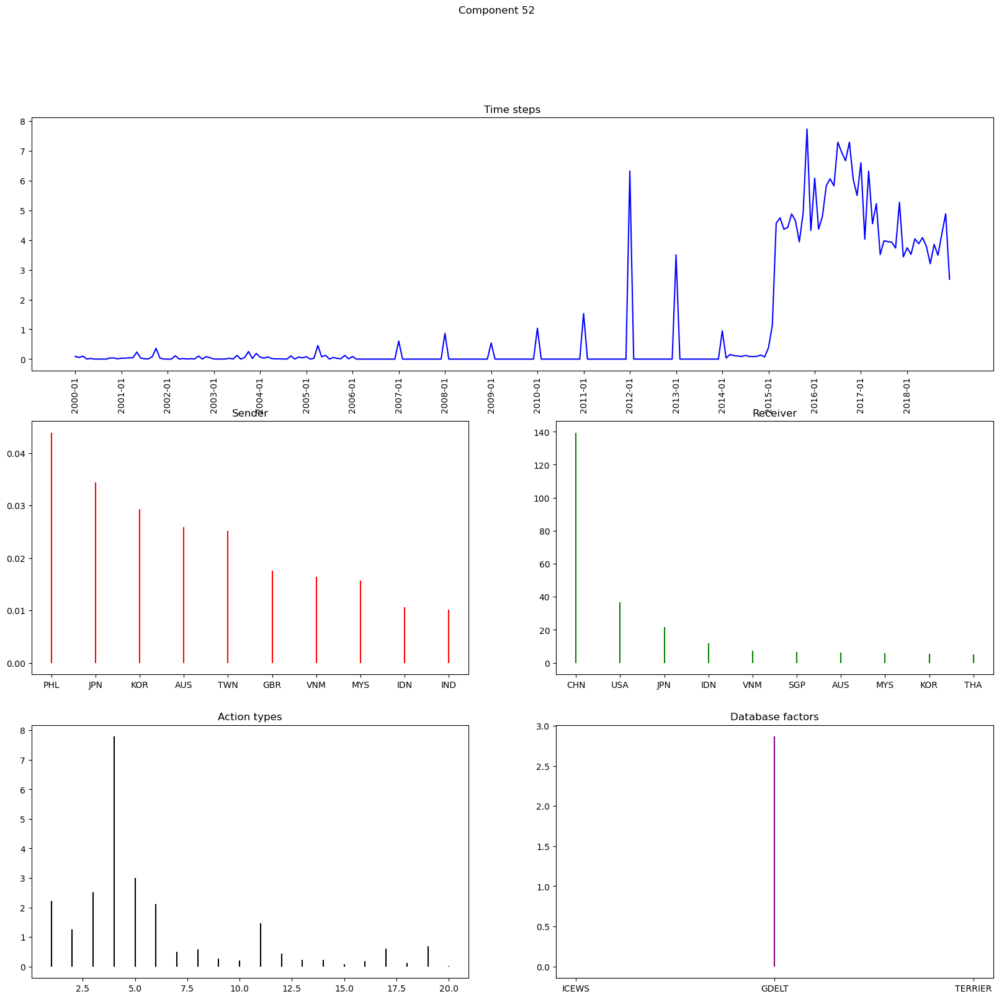

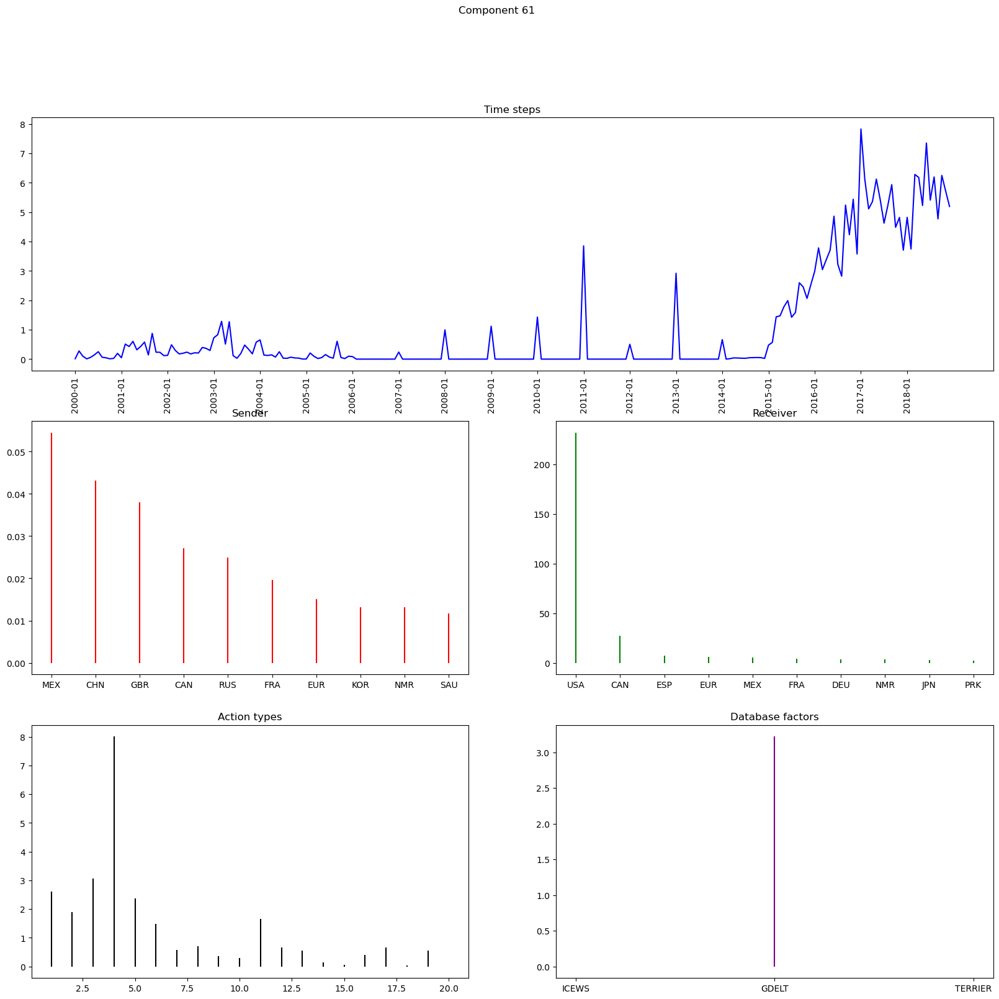

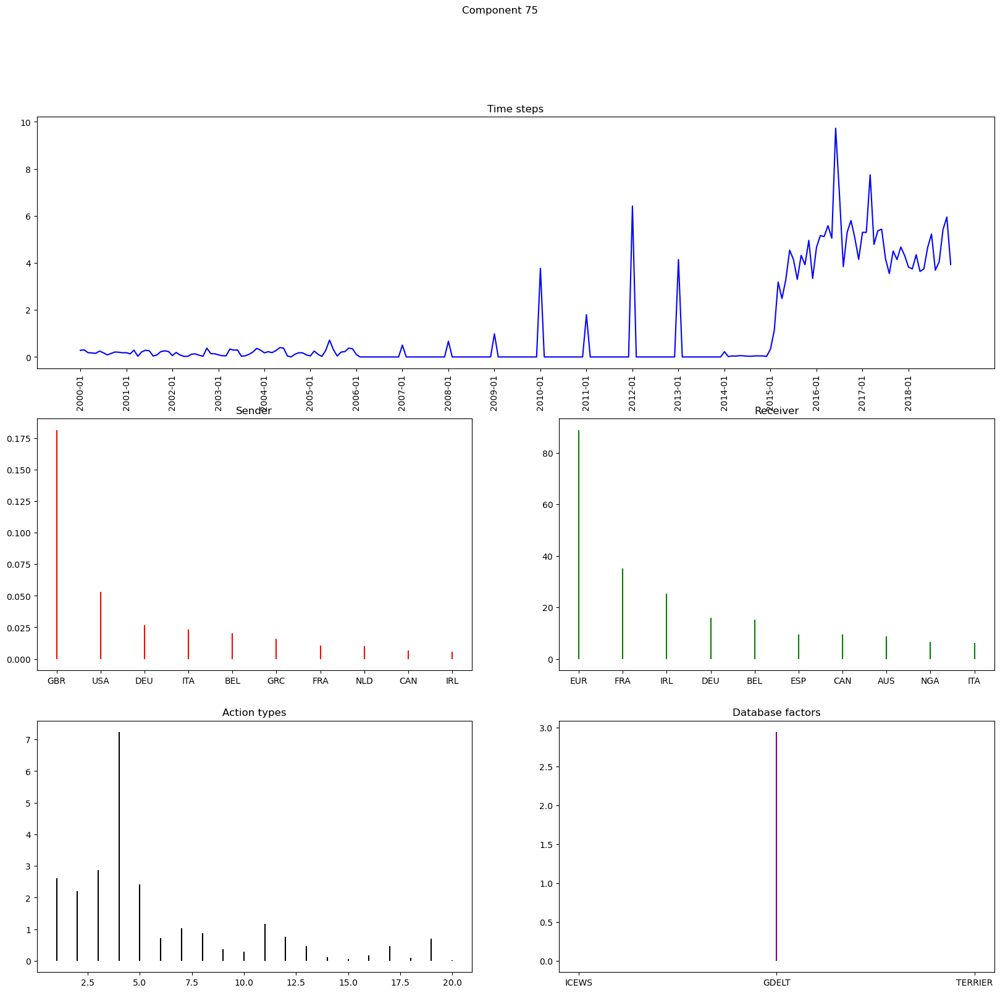

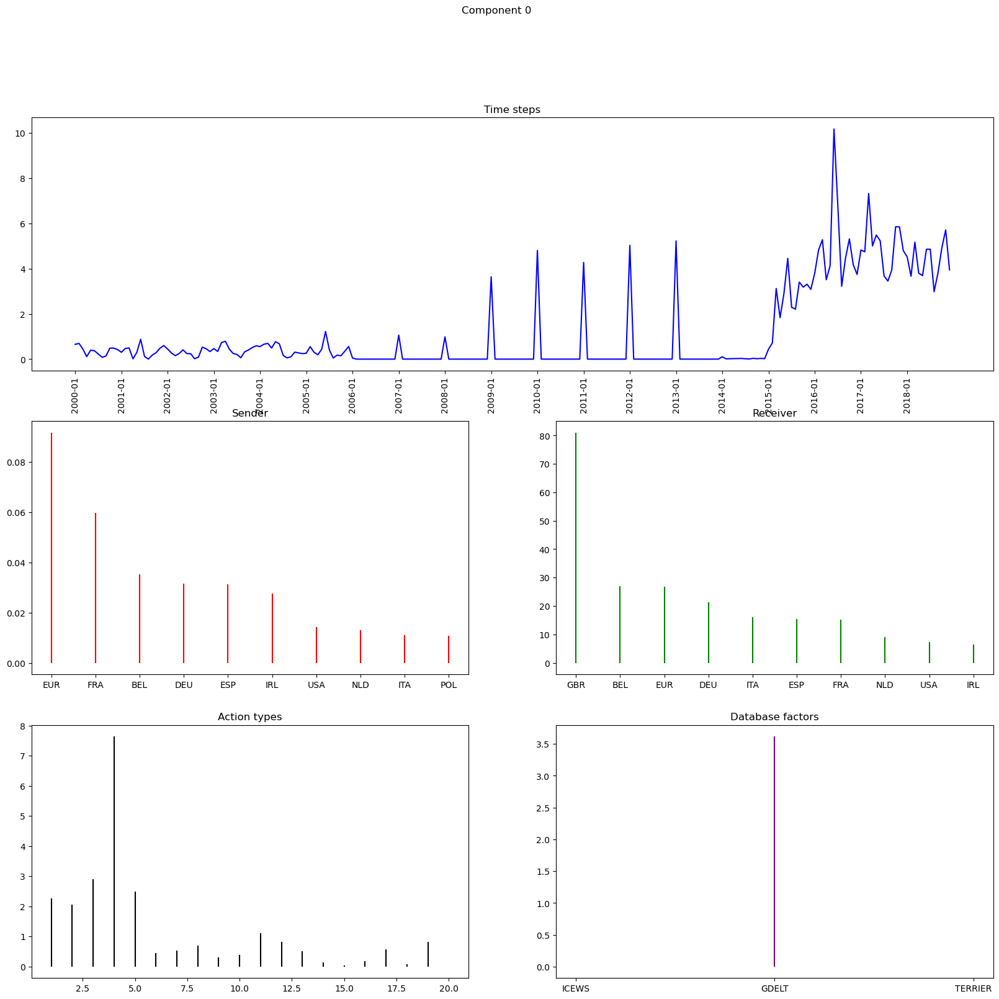

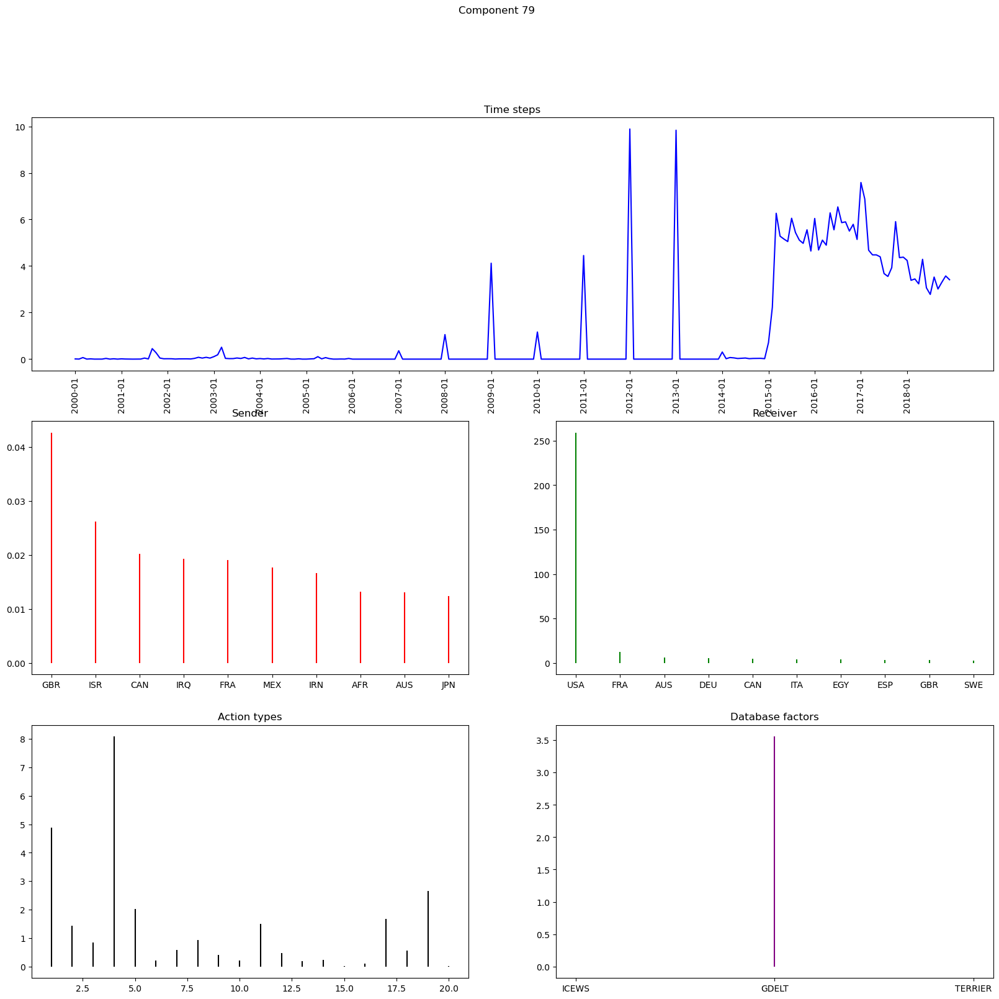

In [20]:
database_factor_matrix = bptf_5mode.G_DK_M[4]
database_factor_matrix = database_factor_matrix/database_factor_matrix.sum(axis=0,keepdims=1)
database_entropy = st.entropy(database_factor_matrix, axis=0)
database_components = pd.DataFrame({
    'ICEWS' : database_factor_matrix[0, :],
    'TERRIER' : database_factor_matrix[1, :],
    'GDELT' : database_factor_matrix[2, :],
    'entropy' : database_entropy,
    'index' : range(n_components)
}).sort_values(by='entropy', ascending=False)

def component_analysis_plot(component):

    fig = plt.figure(figsize=(20, 18))
    gs = fig.add_gridspec(3, 2, height_ratios=[1, 1, 1])

    ax1 = fig.add_subplot(gs[0, :])
    time_vector = bptf_5mode.G_DK_M[3][:, component]
    time_vector = pd.DataFrame({
        'time steps' : time_vector,
        'index' : range(time_vector.shape[0])
    })
    time_vector = pd.merge(
        left=time_vector, right=date_indices,
        how='left', on='index'
    )
    ax1.plot(time_vector['date'], time_vector['time steps'], color='b')
    ticks = ax1.get_xticks()[::12]
    ax1.set_xticks(ticks)
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title('Time steps')

    ax2 = fig.add_subplot(gs[1, 0])
    sender_vector = bptf_5mode.G_DK_M[0][:, component]
    sender_vector = pd.DataFrame({
        'sender' : sender_vector,
        'index' : range(sender_vector.shape[0])})
    sender_vector = pd.merge(
        left=sender_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='sender', 
        ascending=False).iloc[:10, :]
    ax2.vlines(x=sender_vector['country'], ymin=0, ymax=sender_vector['sender'], color='r')
    ax2.set_title('Sender')

    ax3 = fig.add_subplot(gs[1, 1])
    receiver_vector = bptf_5mode.G_DK_M[1][:, component]
    receiver_vector = pd.DataFrame({
        'receiver' : receiver_vector,
        'index' : range(receiver_vector.shape[0])})
    receiver_vector = pd.merge(
        left=receiver_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='receiver', ascending=False
    ).iloc[:10, :]
    ax3.vlines(x=receiver_vector['country'], ymin=0, ymax=receiver_vector['receiver'], color='g')
    ax3.set_title('Receiver')

    ax4 = fig.add_subplot(gs[2, 0])
    action_vector = bptf_5mode.G_DK_M[2][:, component]
    action_vector = pd.DataFrame({
        'action' : action_vector,
        'action type' : range(1, 21)
    })
    ax4.vlines(x=action_vector['action type'], ymin=0, ymax=action_vector['action'], color='black')
    ax4.set_title('Action types')

    ax5 = fig.add_subplot(gs[2, 1])
    database_vector = bptf_5mode.G_DK_M[4][:, component]
    database_vector = pd.DataFrame({
        'factor' : database_vector,
        'index' : range(database_vector.shape[0])
    })
    database_vector = pd.merge(
        left=database_vector, right=database_indices,
        how='left', on='index'
    )
    ax5.vlines(x=database_vector['database'], ymin=0, ymax=database_vector['factor'], color='purple')
    ax5.set_title('Database factors')

    fig.suptitle('Component ' + str(component))

    plt.show()

for component in database_components['index']:
    component_analysis_plot(component)